In [20]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from chaosmagpy.model_utils import design_gauss
import cartopy.crs as ccrs
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from alberte_klara_lib import do_design, plot_map_three
from alberte_klara_lib import n_int_max, n_ext_max, theta_grid, phi_grid
import os

from alberte_klara_lib import do_design, plot_map_three, plot_map_one, do_design_timetrend


In [21]:
data_dst = "ready_oersted_data\oersted_dark_quiet_01.txt"
data = pd.read_table(data_dst, delimiter = ",")
data

<>:1: SyntaxWarning: invalid escape sequence '\o'
<>:1: SyntaxWarning: invalid escape sequence '\o'
C:\Users\alber\AppData\Local\Temp\ipykernel_3288\3124068728.py:1: SyntaxWarning: invalid escape sequence '\o'
  data_dst = "ready_oersted_data\oersted_dark_quiet_01.txt"


,time_stamp,radius,colat,lon,B_r,B_theta,B_phi,X,Y,Z,dDst,Hp30,F,B_radius
0,550.604304,7056.472,86.2373,162.9674,2118.56,-25337.26,3308.42,25337.26,3308.42,-2118.56,2.993547,1.337410,25640.021133,2118.56
1,550.605040,7050.781,82.3599,162.2569,-1298.08,-25103.84,2973.38,25103.84,2973.38,1298.08,2.958229,1.360963,25312.621023,-1298.08
2,550.605776,7045.419,78.4770,161.5375,-4606.32,-24759.49,2602.71,24759.49,2602.71,4606.32,2.922912,1.384516,25318.464178,-4606.32
3,550.606511,7040.412,74.5893,160.8047,-7815.61,-24341.05,2181.53,24341.05,2181.53,7815.61,2.887595,1.408069,25657.933430,-7815.61
4,550.607247,7035.785,70.6980,160.0535,-10947.57,-23866.71,1723.54,23866.71,1723.54,10947.57,2.852283,1.431618,26314.249472,-10947.57
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66410,734.980881,7104.813,14.8757,-167.9754,-41389.33,-5366.13,1509.09,5366.13,1509.09,41389.33,0.041075,1.000000,41763.014039,-41389.33
66411,734.981617,7098.089,18.4046,-173.6034,-40787.78,-7205.83,1482.19,7205.83,1482.19,40787.78,0.058734,1.000000,41445.915004,-40787.78
66412,734.982353,7091.501,22.0436,-177.5411,-39878.43,-9054.98,1339.33,9054.98,1339.33,39878.43,0.076393,1.000000,40915.469531,-39878.43
66413,734.983088,7085.077,25.7492,179.5206,-38661.37,-10829.82,1170.40,10829.82,1170.40,38661.37,0.094051,1.000000,40166.607620,-38661.37


In [22]:
nm_static = (n_int_max + 1)**2 - 1 + (n_ext_max + 1)**2 - 1
n_obs = len(data)

# lhs and rhs of lst sq prb will have to be constructed bit by bit
# allocating these in memory
lhs = np.zeros((nm_static, nm_static)) # G.T@G
rhs = np.zeros((nm_static,)) # G.T@d

# taking 10k data point at a time (sub matrix, chunk of data, G_sub) - but still all model parameters
i = 0
while (i <= n_obs - 10*10**3):
    i10k = i + 10*10**3

    G_int = np.vstack((design_gauss(data['radius'].iloc[i:i10k], data['colat'].iloc[i:i10k], data['lon'].iloc[i:i10k], nmax=n_int_max)))
    print(G_int.shape)
    G_ext = np.vstack((design_gauss(data['radius'].iloc[i:i10k], data['colat'].iloc[i:i10k], data['lon'].iloc[i:i10k], nmax=n_ext_max, source = 'external')))
    G = np.hstack((G_int, G_ext))
    lhs += G.T@G

    d = np.hstack((data['B_radius'].iloc[i:i10k], data['B_theta'].iloc[i:i10k], data['B_phi'].iloc[i:i10k]))
    rhs += G.T@d
    i += 10*10**3

G_int = np.vstack((design_gauss(data['radius'].iloc[i:], data['colat'].iloc[i:], data['lon'].iloc[i:], nmax=n_int_max)))
G_ext = np.vstack((design_gauss(data['radius'].iloc[i:], data['colat'].iloc[i:], data['lon'].iloc[i:], nmax=n_ext_max, source = 'external')))
G = np.hstack((G_int, G_ext))
lhs += G.T@G

d = np.hstack((data['B_radius'].iloc[i:], data['B_theta'].iloc[i:], data['B_phi'].iloc[i:]))
rhs += G.T@d


m = np.linalg.solve(lhs, rhs)

m_int_static = m[:-((n_ext_max + 1)**2 - 1)]
m_ext_static = m[-((n_ext_max + 1)**2 - 1):]

np.savetxt(os.path.join('ready_oersted_data', 'int_model_static_parameters'), m_int_static)
np.savetxt(os.path.join('ready_oersted_data', 'ext_model_static_parameters'), m_ext_static)

(30000, 195)
(30000, 195)
(30000, 195)
(30000, 195)
(30000, 195)
(30000, 195)


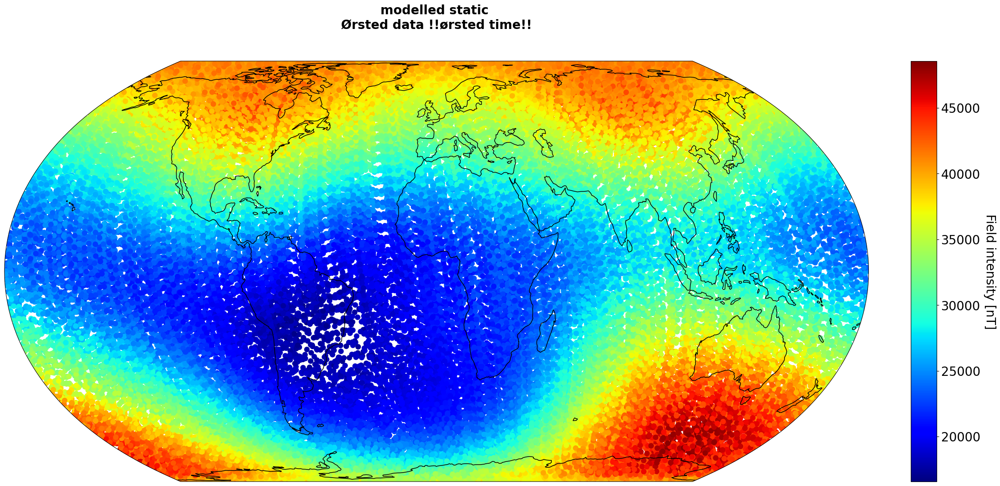

In [23]:
# Predicted field at Swarm altitude
G_pred_static_radius, G_pred_static_theta, G_pred_static_phi = do_design(data['radius'], data['colat'], data['lon'], n_int_max, n_ext_max)

b_pred_static_radius = G_pred_static_radius @ m
b_pred_static_theta = G_pred_static_theta @ m
b_pred_static_phi = G_pred_static_phi @ m

# field intensity
F_pred_static = np.sqrt(b_pred_static_radius**2 + b_pred_static_theta**2 + b_pred_static_phi**2)

plot_map_one(F_pred_static, data['lon'], data['colat'], sat='Ørsted', title='modelled static', label='Field intensity [nT]', scatter_size=80)

# Residuals between model-predicted field and measured field

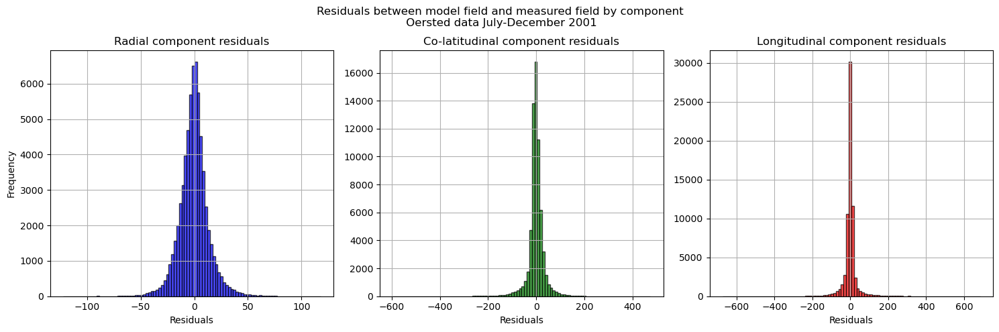

In [24]:
# Residuals
residuals_r_static = data['B_radius'] - b_pred_static_radius
residuals_t_static = data['B_theta'] - b_pred_static_theta
residuals_p_static = data['B_phi'] - b_pred_static_phi


# Plot histogram of residuals
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Plot histogram of residuals_r
axs[0].hist(residuals_r_static, bins=100, color='blue', edgecolor='black', alpha=0.7)
axs[0].set_xlabel('Residuals')
axs[0].set_ylabel('Frequency')
axs[0].set_title('Radial component residuals')
axs[0].grid(True)

# Plot histogram of residuals_t
axs[1].hist(residuals_t_static, bins=100, color='green', edgecolor='black', alpha=0.7)
axs[1].set_xlabel('Residuals')
# axs[1].set_ylabel('Frequency')
axs[1].set_title('Co-latitudinal component residuals')
axs[1].grid(True)

# Plot histogram of residuals_p
axs[2].hist(residuals_p_static, bins=100, color='red', edgecolor='black', alpha=0.7)
axs[2].set_xlabel('Residuals')
# axs[2].set_ylabel('Frequency')
axs[2].set_title('Longitudinal component residuals')
axs[2].grid(True)

# Adjust layout
plt.tight_layout()
plt.subplots_adjust(top=0.85)

fig.suptitle('Residuals between model field and measured field by component\n Oersted data July-December 2001')
plt.savefig('oersted_figures/oersted_differet_times/oersted_residuals_jun_dec01.png')

plt.show()



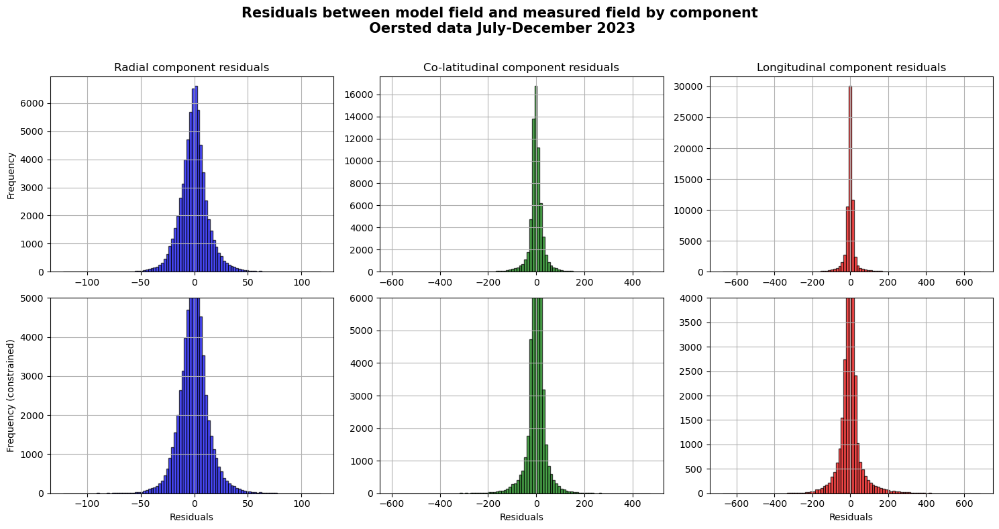

In [25]:
# Plot histogram of residuals
fig, axs = plt.subplots(2, 3, figsize=(15, 8))

# Plot histogram of residuals_r
axs[0, 0].hist(residuals_r_static, bins=100, color='blue', edgecolor='black', alpha=0.7)
axs[0, 0].set_ylabel('Frequency')
axs[0, 0].set_title('Radial component residuals')
axs[0, 0].grid(True)

# Plot histogram of residuals_t
axs[0, 1].hist(residuals_t_static, bins=100, color='green', edgecolor='black', alpha=0.7)
axs[0, 1].set_title('Co-latitudinal component residuals')
axs[0, 1].grid(True)

# Plot histogram of residuals_p
axs[0, 2].hist(residuals_p_static, bins=100, color='red', edgecolor='black', alpha=0.7)
axs[0, 2].set_title('Longitudinal component residuals')
axs[0, 2].grid(True)

# Plot histogram of residuals_r (constrained)
axs[1, 0].hist(residuals_r_static, bins=100, color='blue', edgecolor='black', alpha=0.7)
axs[1, 0].set_xlabel('Residuals')
axs[1, 0].set_ylabel('Frequency (constrained)')
axs[1, 0].set_ylim(0, 5000)
axs[1, 0].grid(True)

# Plot histogram of residuals_t (constrained)
axs[1, 1].hist(residuals_t_static, bins=100, color='green', edgecolor='black', alpha=0.7)
axs[1, 1].set_xlabel('Residuals')
axs[1, 1].set_ylim(0, 6000)
axs[1, 1].grid(True)

# Plot histogram of residuals_p (constrained)
axs[1, 2].hist(residuals_p_static, bins=100, color='red', edgecolor='black', alpha=0.7)
axs[1, 2].set_xlabel('Residuals')
axs[1, 2].set_ylim(0, 4000)
axs[1, 2].grid(True)

# Adjust layout
plt.tight_layout()
plt.subplots_adjust(top=0.85)

fig.suptitle('Residuals between model field and measured field by component\n Oersted data July-December 2023', weight = 'bold', fontsize = 15)

plt.show()

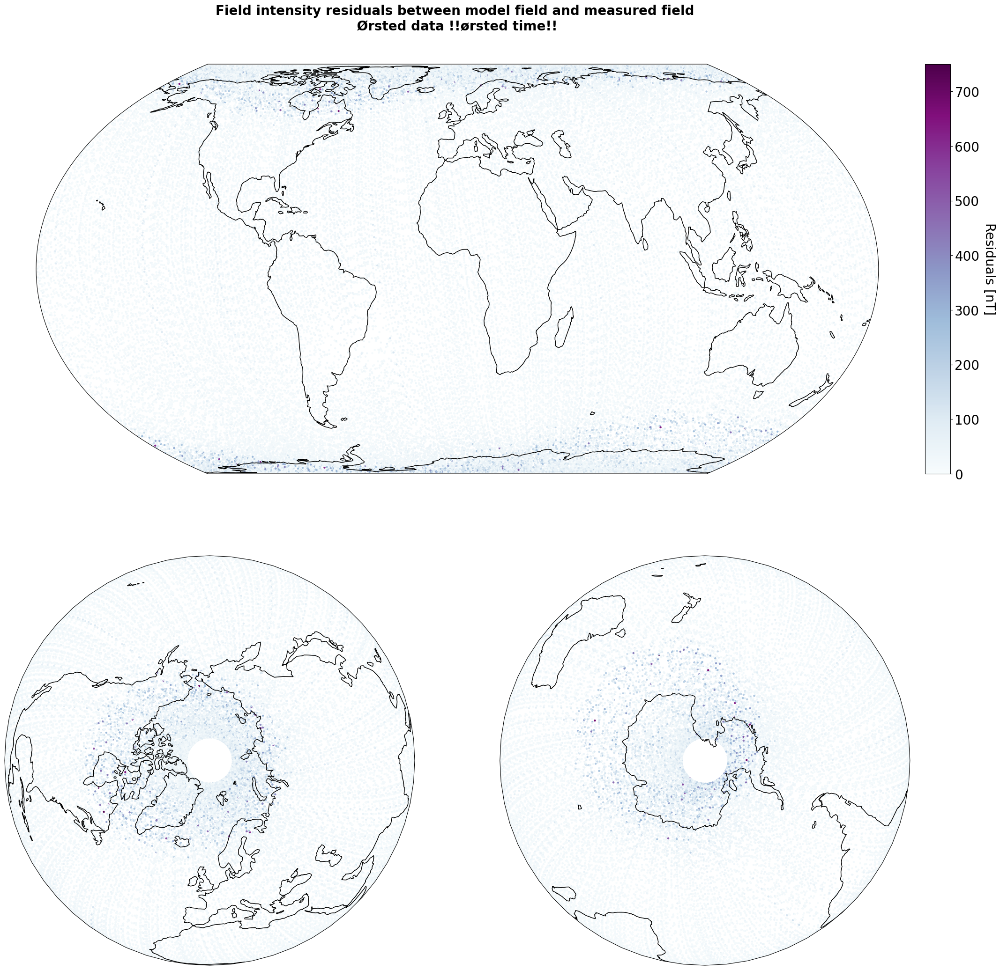

In [26]:
# Intensity of residuals on map
F_residuals = np.sqrt(residuals_r_static**2 + residuals_t_static**2 + residuals_p_static**2)

plot_map_three(F_residuals, data['lon'], data['colat'], 'Oersted', 'Field intensity residuals between model field and measured field', 'Residuals [nT]', scatter_size = 10, clim=[0, 750], colors='BuPu')

# Model with temporal gradient - linear trend of secular variation


In [27]:
t0_exact = data['time_stamp'].iloc[0] + (data['time_stamp'].iloc[-1] - data['time_stamp'].iloc[0])/2 # exact midpoint considering start and end time. matches no
# must manipulate with time stamp because data points have been removed
t = np.floor(round(data['time_stamp'], 2)*10)/10
t0_idx = np.where(t == round(t0_exact, 1))[0][-1] # -0.1 because there are no matches prior to this
t0 = data['time_stamp'].iloc[t0_idx]
print("t0 = " + str(t0) + " at index " + str(t0_idx))

# temporal gradient
data['time_grad'] = data['time_stamp'] - t0


t0 = 642.89481418 at index 36056


In [28]:
G_pred_radius1, G_pred_theta1, G_pred_phi1 = do_design_timetrend(data['radius'], data['colat'], data['lon'], n_int_max, n_ext_max, data['time_grad'].values)

# What solving method is best

In [29]:
nm = ((n_int_max + 1)**2 - 1)*2 + (n_ext_max + 1)**2 - 1

# lhs and rhs of lst sq prb will have to be constructed bit by bit
# allocating these in memory
lhs = np.zeros((nm, nm)) # G.T@G
rhs = np.zeros((nm,)) # G.T@d

# taking 10k data point at a time (sub matrix, chunk of data, G_sub)
i = 0
while (i <= n_obs - 10*10**3):
    i10k = i + 10*10**3

    G_int_static = np.vstack((design_gauss(data['radius'].iloc[i:i10k], data['colat'].iloc[i:i10k], data['lon'].iloc[i:i10k], nmax=n_int_max)))
    G_ext = np.vstack((design_gauss(data['radius'].iloc[i:i10k], data['colat'].iloc[i:i10k], data['lon'].iloc[i:i10k], nmax=n_ext_max, source = 'external')))
    G_int_sec = ((np.vstack((design_gauss(data['radius'].iloc[i:i10k], data['colat'].iloc[i:i10k], data['lon'].iloc[i:i10k], 
                                          nmax=n_int_max))).T)*np.tile(data['time_grad'].iloc[i:i10k], 3)).T
    G = np.hstack((G_int_static, G_ext, G_int_sec))
    lhs += G.T@G

    d = np.hstack((data['B_radius'].iloc[i:i10k], data['B_theta'].iloc[i:i10k], data['B_phi'].iloc[i:i10k]))
    rhs += G.T@d
    i += 10*10**3

G_int_static = np.vstack((design_gauss(data['radius'].iloc[i:], data['colat'].iloc[i:], data['lon'].iloc[i:], nmax=n_int_max)))
G_ext = np.vstack((design_gauss(data['radius'].iloc[i:], data['colat'].iloc[i:], data['lon'].iloc[i:], nmax=n_ext_max, source = 'external')))
G_int_sec = ((np.vstack((design_gauss(data['radius'].iloc[i:], data['colat'].iloc[i:], data['lon'].iloc[i:], nmax=n_int_max))).T)*np.tile(data['time_grad'].iloc[i:], 3)).T
G = np.hstack((G_int_static, G_ext, G_int_sec))
lhs += G.T@G

d = np.hstack((data['B_radius'].iloc[i:], data['B_theta'].iloc[i:], data['B_phi'].iloc[i:]))
rhs += G.T@d

In [30]:
# solving inverse problem with two different methods

m_all1 = np.linalg.solve(lhs, rhs)
m_all2 = np.linalg.lstsq(lhs, rhs)[0]

m_int = m_all2[:(n_int_max + 1)**2 - 1] + m_all2[-((n_int_max + 1)**2 - 1):]
m_ext = m_all2[(n_int_max + 1)**2 - 1:nm_static]

print(m_all1.shape)
print(m_all2.shape)

(393,)
(393,)


C:\Users\alber\AppData\Local\Temp\ipykernel_3288\2583576088.py:4: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  m_all2 = np.linalg.lstsq(lhs, rhs)[0]


In [31]:
b_pred_radius1 = G_pred_radius1 @ m_all1
b_pred_theta1 = G_pred_theta1 @ m_all1
b_pred_phi1 = G_pred_phi1 @ m_all1

b_pred_radius2 = G_pred_radius1 @ m_all2
b_pred_theta2 = G_pred_theta1 @ m_all2
b_pred_phi2 = G_pred_phi1 @ m_all2

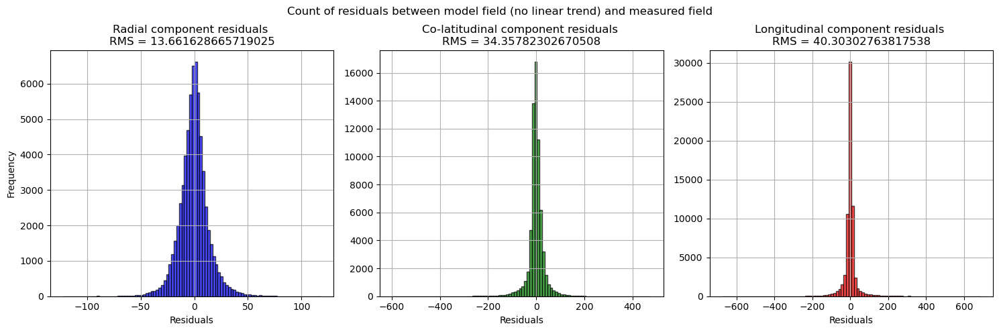

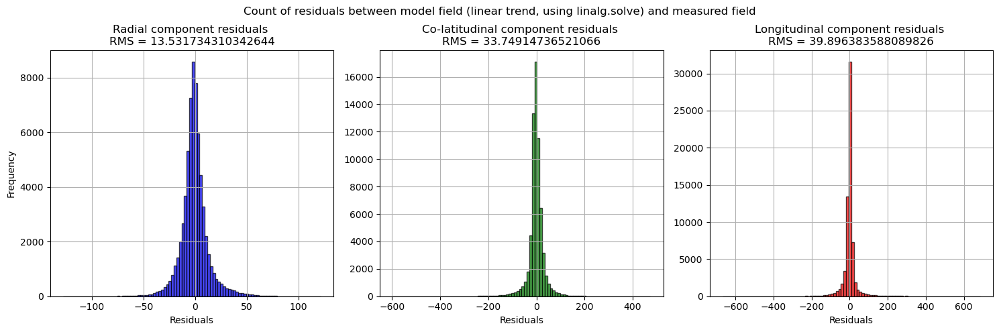

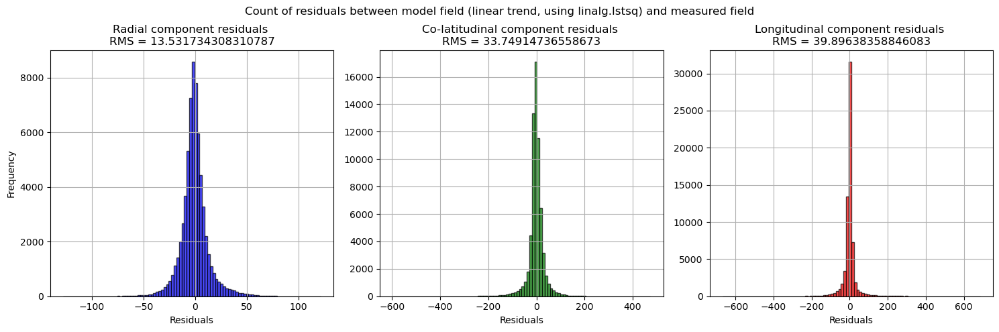

In [32]:
# Residuals
# residuals_r = data['B_radius'] - b_pred_radius
# residuals_t = data['B_theta'] - b_pred_theta
# residuals_p = data['B_phi'] - b_pred_phi

residuals_r1 = data['B_radius'] - b_pred_radius1
residuals_t1 = data['B_theta'] - b_pred_theta1
residuals_p1 = data['B_phi'] - b_pred_phi1

residuals_r2 = data['B_radius'] - b_pred_radius2
residuals_t2 = data['B_theta'] - b_pred_theta2
residuals_p2 = data['B_phi'] - b_pred_phi2


# Plot histogram of residuals
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Plot histogram of residuals_r
axs[0].hist(residuals_r_static, bins=100, color='blue', edgecolor='black', alpha=0.7)
axs[0].set_xlabel('Residuals')
axs[0].set_ylabel('Frequency')
axs[0].set_title('Radial component residuals \nRMS = ' + str(np.sqrt(np.mean(residuals_r_static**2))))
axs[0].grid(True)

# Plot histogram of residuals_t
axs[1].hist(residuals_t_static, bins=100, color='green', edgecolor='black', alpha=0.7)
axs[1].set_xlabel('Residuals')
axs[1].set_title('Co-latitudinal component residuals \nRMS = ' + str(np.sqrt(np.mean(residuals_t_static**2))))
axs[1].grid(True)

# Plot histogram of residuals_p
axs[2].hist(residuals_p_static, bins=100, color='red', edgecolor='black', alpha=0.7)
axs[2].set_xlabel('Residuals')
axs[2].set_title('Longitudinal component residuals \nRMS = ' + str(np.sqrt(np.mean(residuals_p_static**2))))
axs[2].grid(True)

# Adjust layout
plt.tight_layout()
plt.subplots_adjust(top=0.85)

fig.suptitle('Count of residuals between model field (no linear trend) and measured field')

plt.show()


# Plot histogram of residuals
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Plot histogram of residuals_r
axs[0].hist(residuals_r1, bins=100, color='blue', edgecolor='black', alpha=0.7)
axs[0].set_xlabel('Residuals')
axs[0].set_ylabel('Frequency')
axs[0].set_title('Radial component residuals \nRMS = ' + str(np.sqrt(np.mean(residuals_r1**2))))
axs[0].grid(True)

# Plot histogram of residuals_t
axs[1].hist(residuals_t1, bins=100, color='green', edgecolor='black', alpha=0.7)
axs[1].set_xlabel('Residuals')
axs[1].set_title('Co-latitudinal component residuals \nRMS = ' + str(np.sqrt(np.mean(residuals_t1**2))))
axs[1].grid(True)

# Plot histogram of residuals_p
axs[2].hist(residuals_p1, bins=100, color='red', edgecolor='black', alpha=0.7)
axs[2].set_xlabel('Residuals')
axs[2].set_title('Longitudinal component residuals \nRMS = ' + str(np.sqrt(np.mean(residuals_p1**2))))
axs[2].grid(True)

# Adjust layout
plt.tight_layout()
plt.subplots_adjust(top=0.85)

fig.suptitle('Count of residuals between model field (linear trend, using linalg.solve) and measured field')

plt.show()


# Plot histogram of residuals
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Plot histogram of residuals_r
axs[0].hist(residuals_r2, bins=100, color='blue', edgecolor='black', alpha=0.7)
axs[0].set_xlabel('Residuals')
axs[0].set_ylabel('Frequency')
axs[0].set_title('Radial component residuals \nRMS = ' + str(np.sqrt(np.mean(residuals_r2**2))))
axs[0].grid(True)

# Plot histogram of residuals_t
axs[1].hist(residuals_t2, bins=100, color='green', edgecolor='black', alpha=0.7)
axs[1].set_xlabel('Residuals')
axs[1].set_title('Co-latitudinal component residuals \nRMS = ' + str(np.sqrt(np.mean(residuals_t2**2))))
axs[1].grid(True)

# Plot histogram of residuals_p
axs[2].hist(residuals_p2, bins=100, color='red', edgecolor='black', alpha=0.7)
axs[2].set_xlabel('Residuals')
axs[2].set_title('Longitudinal component residuals \nRMS = ' + str(np.sqrt(np.mean(residuals_p2**2))))
axs[2].grid(True)

# Adjust layout
plt.tight_layout()
plt.subplots_adjust(top=0.85)

fig.suptitle('Count of residuals between model field (linear trend, using linalg.lstsq) and measured field')

plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

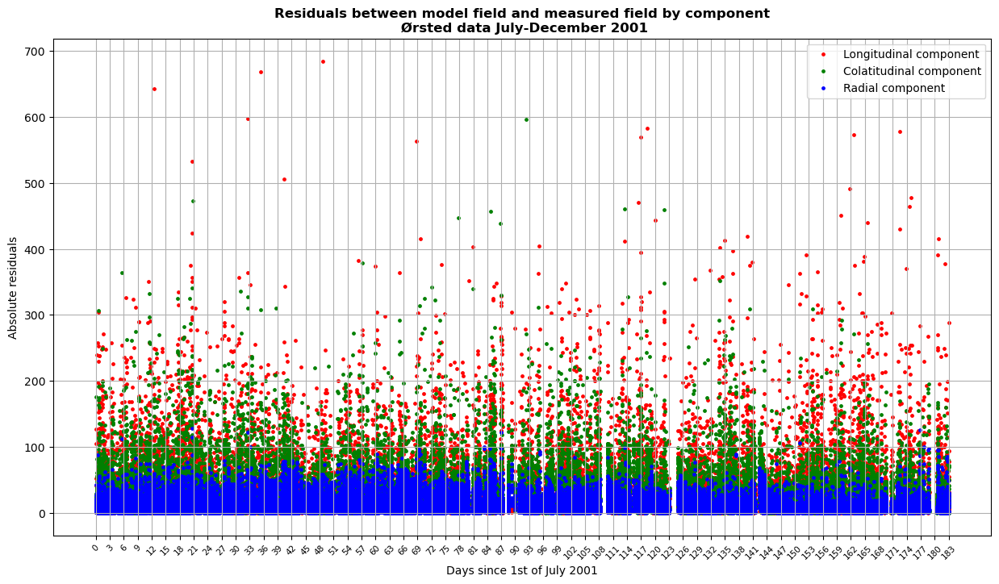

In [33]:
no_days_oersted = round(data['time_stamp'].iloc[-1] - data['time_stamp'].iloc[0])

plt.figure(figsize=(15,8))
plt.scatter(data['time_stamp'], abs(residuals_p2), label = 'Longitudinal component', color = 'red', s = 6)
plt.scatter(data['time_stamp'], abs(residuals_t2), label = 'Colatitudinal component', color = 'green', s = 6)
plt.scatter(data['time_stamp'], abs(residuals_r2), label = 'Radial component', color = 'blue', s = 6)
plt.legend()
plt.grid()
plt.ylabel('Absolute residuals')
tick_positions = np.linspace(data['time_stamp'].iloc[0], data['time_stamp'].iloc[-1], len(range(no_days_oersted)[::3]))
plt.xticks(tick_positions, range(no_days_oersted)[::3], fontsize = 7.5, rotation = 45)
plt.xlabel('Days since 1st of July 2001')
plt.title('Residuals between model field and measured field by component\n Ørsted data July-December 2001', weight = 'bold', fontsize = 12)
plt.show

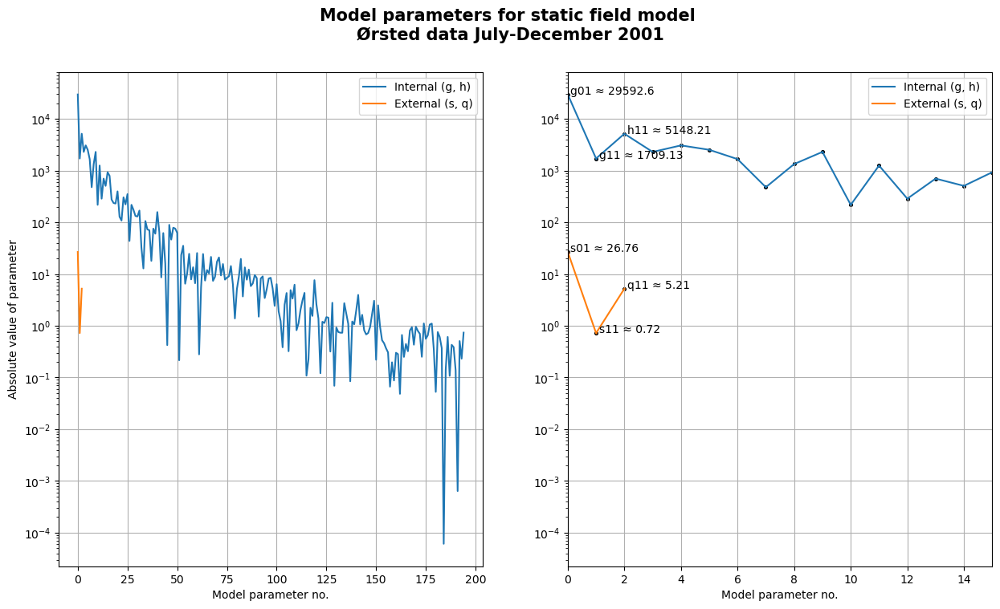

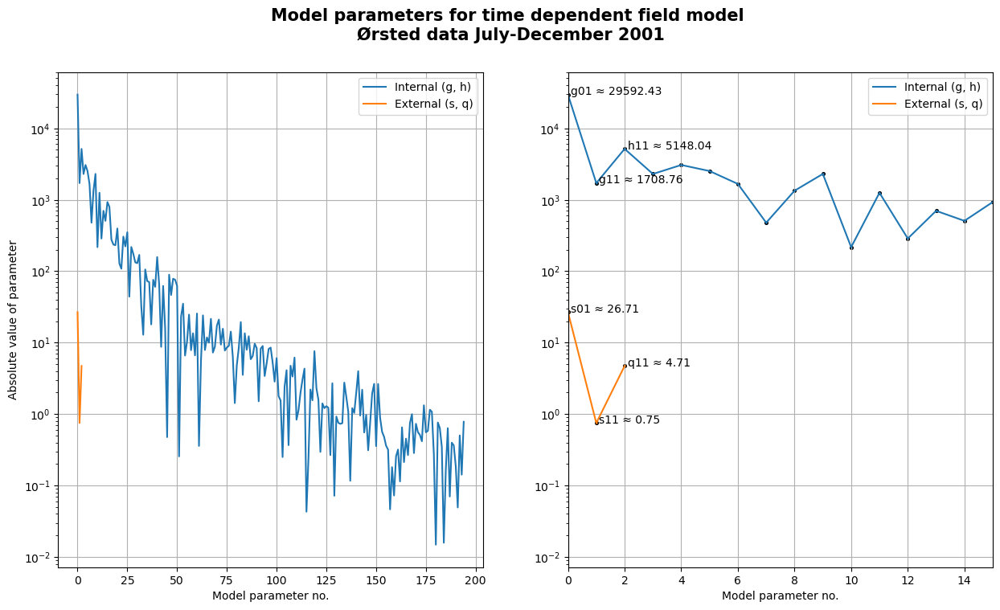

In [34]:
# Plot coefficients for static model
first_three_int = np.round(abs(m_int_static[:3]), 2)
first_three_ext = np.round(abs(m_ext_static[:3]), 2)
first_three_int_str = ['g01 \u2248 ' + str(first_three_int[0]), 'g11 \u2248 ' + str(first_three_int[1]), 'h11 \u2248 ' + str(first_three_int[2])]
first_three_ext_str = ['s01 \u2248 ' + str(first_three_ext[0]), 's11 \u2248 ' + str(first_three_ext[1]), 'q11 \u2248 ' + str(first_three_ext[2])]

plt.figure(figsize=(15, 8))

plt.subplot(1, 2, 1)
plt.semilogy(range((n_int_max + 1)**2 - 1), abs(m_int_static), label='Internal (g, h)')
plt.semilogy(range((n_ext_max + 1)**2 - 1), abs(m_ext_static), label='External (s, q)')
plt.legend()
plt.grid()
plt.ylabel('Absolute value of parameter')
plt.xlabel('Model parameter no.')

plt.subplot(1, 2, 2)
plt.semilogy(range((n_int_max + 1)**2 - 1), abs(m_int_static), label='Internal (g, h)')
plt.semilogy(range((n_ext_max + 1)**2 - 1), abs(m_ext_static), label='External (s, q)')
plt.scatter(range((n_int_max + 1)**2 - 1), abs(m_int_static), s=7, edgecolor='black')
plt.scatter(range((n_ext_max + 1)**2 - 1), abs(m_ext_static), s=7, edgecolor='black')

for i, value in enumerate(first_three_int_str):
    plt.annotate(value, xy=(i, first_three_int[i]), xytext=(i + 0.1, first_three_int[i]))
for i, value in enumerate(first_three_ext_str):
    plt.annotate(value, xy=(i, first_three_ext[i]), xytext=(i + 0.1, first_three_ext[i]))

plt.xlim(0, 15)
plt.legend()
plt.grid()
plt.xlabel('Model parameter no.')
plt.suptitle('Model parameters for static field model \nØrsted data July-December 2001', weight = 'bold', fontsize = 15)

plt.show()


# Plot coefficients for time dependent model
first_three_int = np.round(abs(m_int[:3]), 2)
first_three_ext = np.round(abs(m_ext[:3]), 2)
first_three_int_str = ['g01 \u2248 ' + str(first_three_int[0]), 'g11 \u2248 ' + str(first_three_int[1]), 'h11 \u2248 ' + str(first_three_int[2])]
first_three_ext_str = ['s01 \u2248 ' + str(first_three_ext[0]), 's11 \u2248 ' + str(first_three_ext[1]), 'q11 \u2248 ' + str(first_three_ext[2])]

plt.figure(figsize=(15, 8))

plt.subplot(1, 2, 1)
plt.semilogy(range((n_int_max + 1)**2 - 1), abs(m_int), label='Internal (g, h)')
plt.semilogy(range((n_ext_max + 1)**2 - 1), abs(m_ext), label='External (s, q)')
plt.legend()
plt.grid()
plt.ylabel('Absolute value of parameter')
plt.xlabel('Model parameter no.')

plt.subplot(1, 2, 2)
plt.semilogy(range((n_int_max + 1)**2 - 1), abs(m_int), label='Internal (g, h)')
plt.semilogy(range((n_ext_max + 1)**2 - 1), abs(m_ext), label='External (s, q)')
plt.scatter(range((n_int_max + 1)**2 - 1), abs(m_int), s=7, edgecolor='black')
plt.scatter(range((n_ext_max + 1)**2 - 1), abs(m_ext), s=7, edgecolor='black')

for i, value in enumerate(first_three_int_str):
    plt.annotate(value, xy=(i, first_three_int[i]), xytext=(i + 0.1, first_three_int[i]))
for i, value in enumerate(first_three_ext_str):
    plt.annotate(value, xy=(i, first_three_ext[i]), xytext=(i + 0.1, first_three_ext[i]))

plt.xlim(0, 15)
plt.legend()
plt.grid()
plt.xlabel('Model parameter no.')
plt.suptitle('Model parameters for time dependent field model \nØrsted data July-December 2001', weight = 'bold', fontsize = 15)

plt.show()

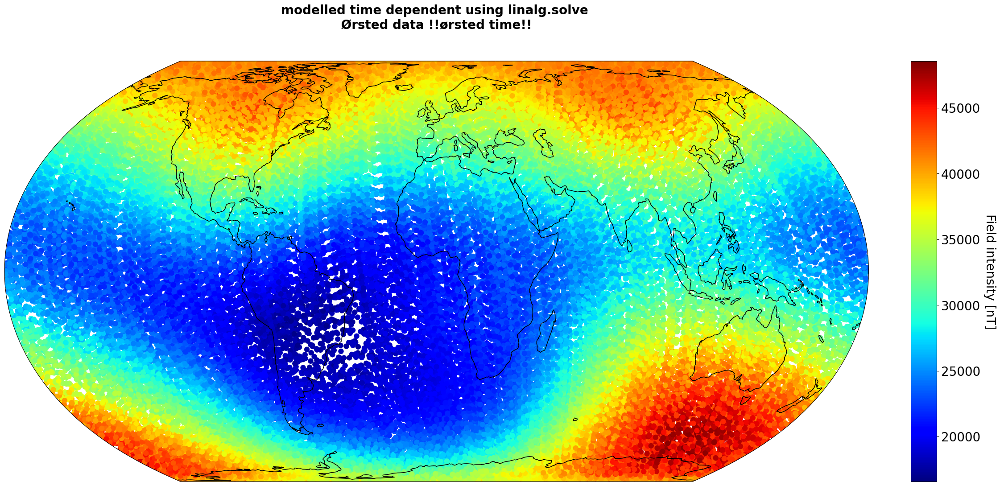

In [35]:
# field intensity of modelled data using linalg.solve

F_pred_time_dep1 = np.sqrt(b_pred_radius1**2 + b_pred_theta1**2 +b_pred_phi1**2)

plot_map_one(F_pred_time_dep1, data['lon'], data['colat'], sat='Ørsted', title='modelled time dependent using linalg.solve', label='Field intensity [nT]', scatter_size=80)

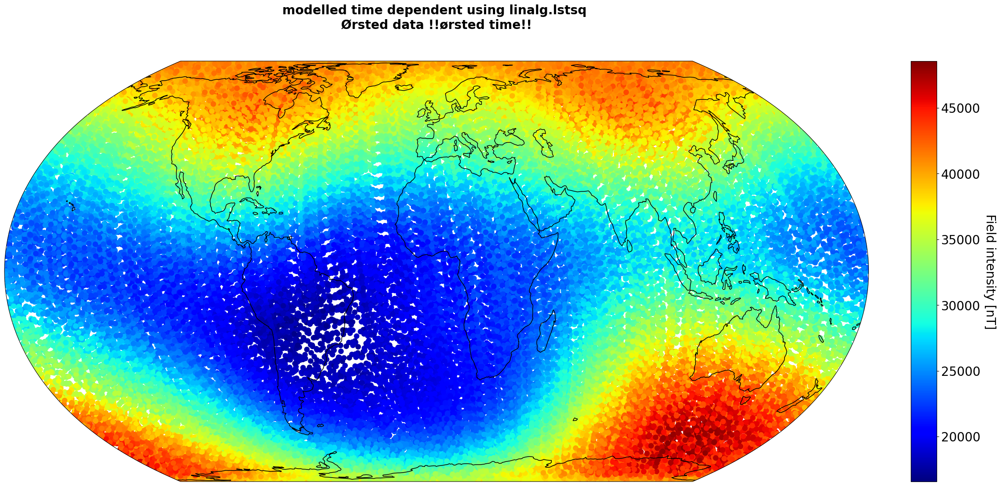

In [36]:
# field intensity of modelled data using linalg.lstsq

F_pred_time_dep2 = np.sqrt(b_pred_radius2**2 + b_pred_theta2**2 +b_pred_phi2**2)

plot_map_one(F_pred_time_dep2, data['lon'], data['colat'], sat='Ørsted', title='modelled time dependent using linalg.lstsq', label='Field intensity [nT]', scatter_size=80)
